Итоговая работа
=====================

Поздравляю вас, теперь вы вооружены знаниями по предобработке данных, и пора применить их на интересном кейсе.

Представлены данные такси, по которым мы должны предсказать возьмёт ли таксист заказ или нет(driver_response).

Принципы вы знаете, чек-лист аналогичен лабораторной работе.

Чек-лист:
1. Загрузите датасет taxi.csv.
2. Посмотрите на данные. Отобразите общую информацию по признакам (вспомните о describe и info). Напишите в markdown свои наблюдения.
3. Выявите пропуски, а также возможные причины их возникновения. Решите, что следует сделать с ними. Напишите в markdown свои наблюдения.
4. Оцените зависимости переменных между собой. Используйте корреляции. Будет хорошо, если воспользуетесь profile_report. Напишите в markdown свои наблюдения.
5. Определите стратегию преобразования категориальных признаков (т.е. как их сделать адекватными для моделей).
6. Найдите признаки, которые можно разделить на другие, или преобразовать в другой тип данных. Удалите лишние, при необходимости.
7. Разделите выборку на обучаемую и тестовую.
8. Обучите модель. Напишите в markdown свои наблюдения по полученным результатам. Хорошие результаты дают классификаторы RandomForest и XGBoost

Если возникнут затруднения, то смотрите на материал практических занятий. Данного там должно хватить для выполнения всех пунктов. Желаю успеха!

**Названия 14 признаков наших data:**
- 'offer_gk'- предложение ГК
- 'weekday_key'- индикатор дня недели (от 0 до 6)
- 'hour_key'- индикатор часа (от 0 до 23)
- 'driver_gk'- водитель ГК
- 'order_gk'- заказ ГК
- 'driver_latitude'- широта водителя
- 'driver_longitude'- долгота водителя
- 'origin_order_latitude'- широта начала 
- 'origin_order_longitude'- долгота начала   
- 'distance_km'- расстояние км
- 'duration_min'- длительность мин
- 'offer_class_group'-  предложение класс группа
- 'ride_type_desc'- описание типа поездки
- 'driver_response'- реакция водителя

## Библиотеки

In [132]:
import pandas as pd

import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

pd.options.display.float_format = '{:,.3f}'.format # формат вывода в pandas

## 1. Загружаем датасет taxi.csv.

In [114]:
# читаем данные в датафрейм средствами Pandas
data = pd.read_csv("taxi.csv")

In [115]:
# содержание первых трех строк дата-фрейма
data.head(3)

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
0,1105373,5,20,6080,174182,55.819,37.335,55.815,37.355,-1.000,-1.000,Economy,private,0
1,759733,5,14,6080,358774,55.805,37.515,55.819,37.466,18.802,25.217,Standard,private,1
2,416977,6,14,6080,866260,55.814,37.348,55.815,37.354,6.747,9.800,Economy,private,0


In [5]:
# выведем все столбцы
data.columns

Index(['offer_gk', 'weekday_key', 'hour_key', 'driver_gk', 'order_gk',
       'driver_latitude', 'driver_longitude', 'origin_order_latitude',
       'origin_order_longitude', 'distance_km', 'duration_min',
       'offer_class_group', 'ride_type_desc', 'driver_response'],
      dtype='object')

## 2. Просмотрим данные (общая информация: describe и info)

In [6]:
# основные статистические характеристики данных 
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
offer_gk,"100,000.000","566,218.929","325,935.980",4.000,"285,555.250","565,671.500","848,719.750","1,130,355.000"
weekday_key,"100,000.000",3.160,2.054,0.000,1.000,3.000,5.000,6.000
hour_key,"100,000.000",13.828,7.306,0.000,8.000,16.000,20.000,23.000
driver_gk,"100,000.000","3,446.376","2,038.739",14.000,"1,421.000","3,506.500","5,242.000","6,806.000"
order_gk,"100,000.000","460,867.013","266,064.990",18.000,"229,178.500","462,420.000","690,894.000","920,344.000"
driver_latitude,"100,000.000",55.701,2.136,-1.000,55.709,55.773,55.961,56.174
driver_longitude,"100,000.000",37.492,1.455,-1.000,37.413,37.534,37.624,38.281
origin_order_latitude,"100,000.000",55.772,0.666,-1.000,55.708,55.773,55.962,56.311
origin_order_longitude,"100,000.000",37.542,0.468,-1.000,37.407,37.533,37.624,38.244
distance_km,"100,000.000",18.394,41.129,-1.000,-1.000,10.412,30.665,"5,234.283"


In [7]:
# основные статистические характеристики данных с учетом текстовых данных include='all'
data.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
offer_gk,"100,000.000",NaN,NaN,NaN,"566,218.929","325,935.980",4.000,"285,555.250","565,671.500","848,719.750","1,130,355.000"
weekday_key,"100,000.000",NaN,NaN,NaN,3.160,2.054,0.000,1.000,3.000,5.000,6.000
hour_key,"100,000.000",NaN,NaN,NaN,13.828,7.306,0.000,8.000,16.000,20.000,23.000
driver_gk,"100,000.000",NaN,NaN,NaN,"3,446.376","2,038.739",14.000,"1,421.000","3,506.500","5,242.000","6,806.000"
order_gk,"100,000.000",NaN,NaN,NaN,"460,867.013","266,064.990",18.000,"229,178.500","462,420.000","690,894.000","920,344.000"
driver_latitude,"100,000.000",NaN,NaN,NaN,55.701,2.136,-1.000,55.709,55.773,55.961,56.174
driver_longitude,"100,000.000",NaN,NaN,NaN,37.492,1.455,-1.000,37.413,37.534,37.624,38.281
origin_order_latitude,"100,000.000",NaN,NaN,NaN,55.772,0.666,-1.000,55.708,55.773,55.962,56.311
origin_order_longitude,"100,000.000",NaN,NaN,NaN,37.542,0.468,-1.000,37.407,37.533,37.624,38.244
distance_km,"100,000.000",NaN,NaN,NaN,18.394,41.129,-1.000,-1.000,10.412,30.665,"5,234.283"


**Что в данных не так на первый взгляд:**
- 'offer_gk'- предложение ГК
- 'driver_gk'- водитель ГК
- 'order_gk'- заказ ГК

**Видимо для следующих факторов надо удалить значение -1 и 0 в данных:**
- 'driver_latitude'- широта (координаты водителя) 
- 'driver_longitude'- долгота (координаты водителя) 
- 'origin_order_latitude'- широта (координаты начала маршрута)
- 'origin_order_longitude'- долгота (координаты начала маршрута)
- 'distance_km'- расстояние км
- 'duration_min'- длительность мин

**Категориальные признаки:**
- 'offer_class_group'- предложение класс группа
- 'ride_type_desc'- описание типа поездки

**Дискретные признаки:**
- 'weekday_key'- индикатор дня недели (от 0 до 6)
- 'hour_key'- индикатор часа (от 0 до 23)
- 'driver_response'- реакция водителя

## 3. Выявление пропусков и аномалий (возможные причины их возникновения) 



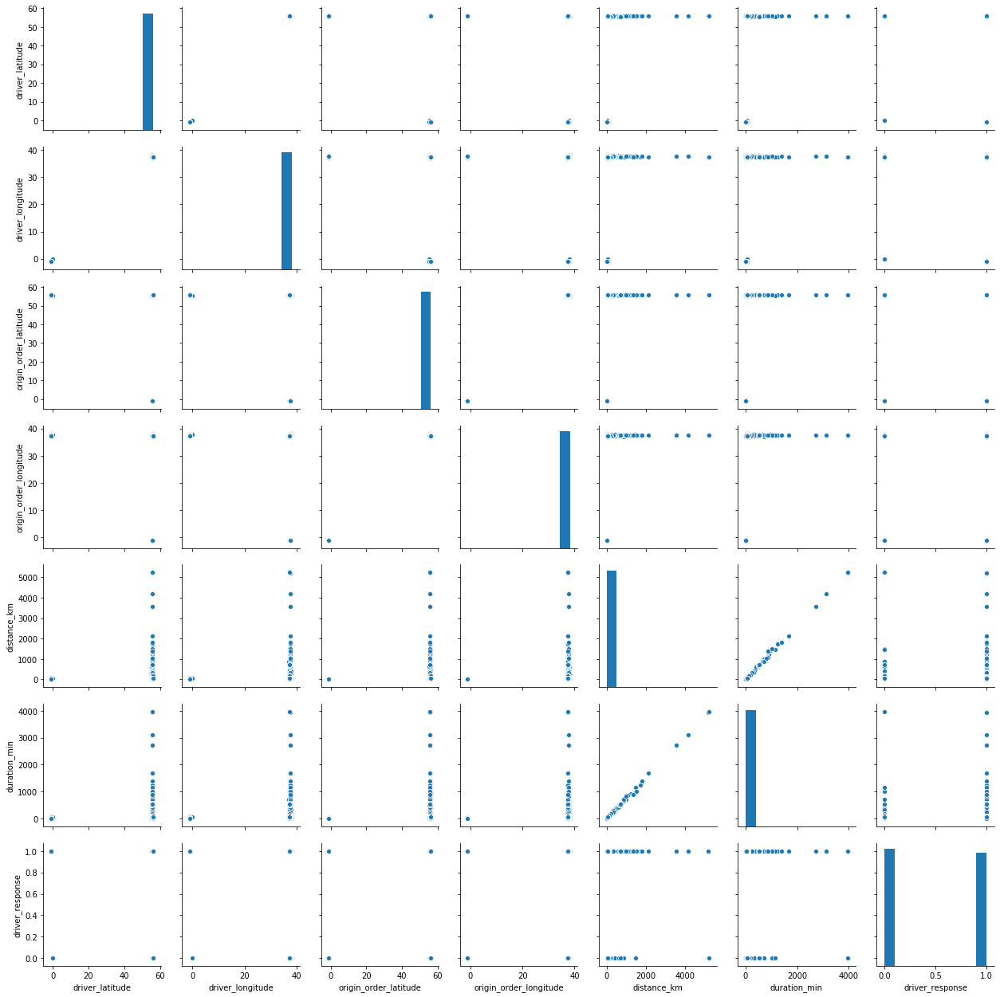

In [66]:
# теперь посмотрим на выбросы (аномалии в данных)
test_columns = ['driver_latitude','driver_longitude','origin_order_latitude','origin_order_longitude','distance_km','duration_min','driver_response']
sns.pairplot(data[test_columns])

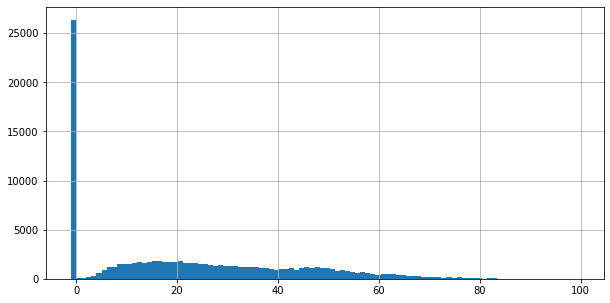

In [9]:
# посмотрим результат на гистограмме, если уберем аномалию (отсеим выброс -1) для driver_latitude. 
data.loc[data['duration_min'] <100,'duration_min'].hist(bins=100,figsize=(10,5))

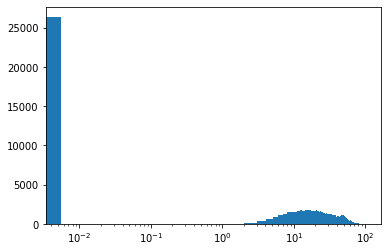

In [10]:
# уберем аномалию (отсеим выброс) для distance_km. в логарифмической шкале график сразу заиграл)))
plt.hist(data.loc[data['duration_min'] <100,'duration_min'], bins=100)
plt.xscale('log')
plt.show()

**Отсеим и посмотрим: data[data['duration_min'] < 0**

In [12]:
duration_zer_data = data[data['duration_min'] <=0]

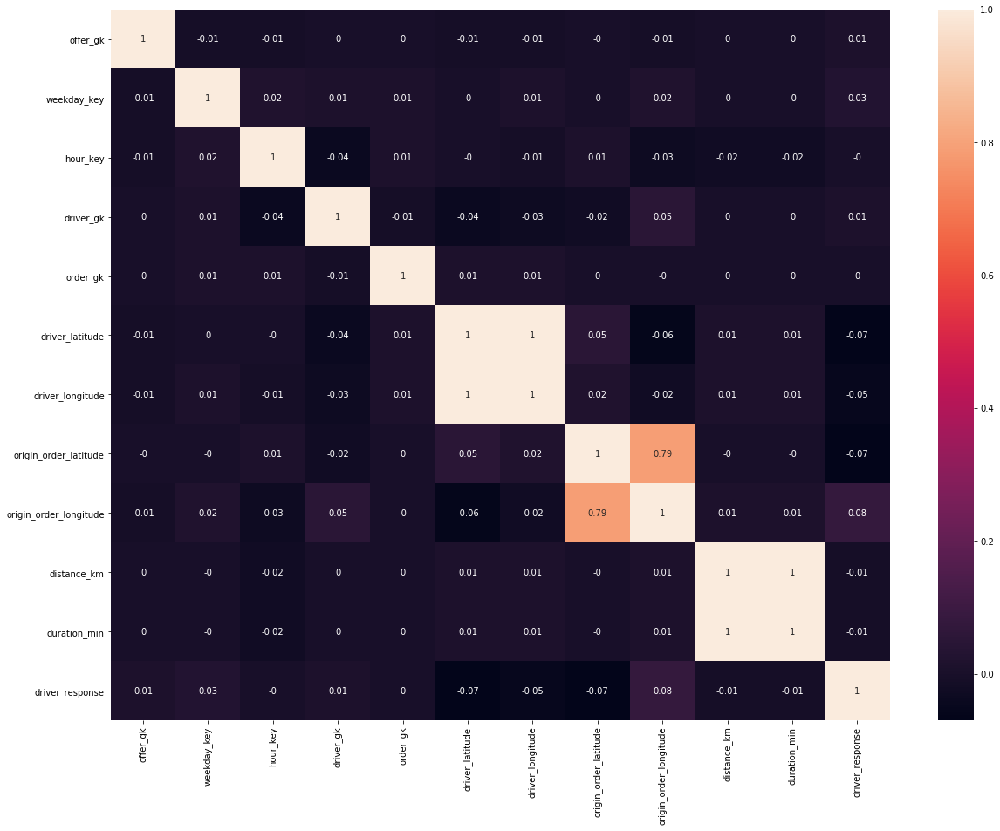

In [15]:
correlation_matrix =duration_zer_data.corr().round(2)
# annot = True to print the values inside the square
fig, ax = plt.subplots(figsize=(20,15)) 
sns.heatmap(data=correlation_matrix, annot=True)

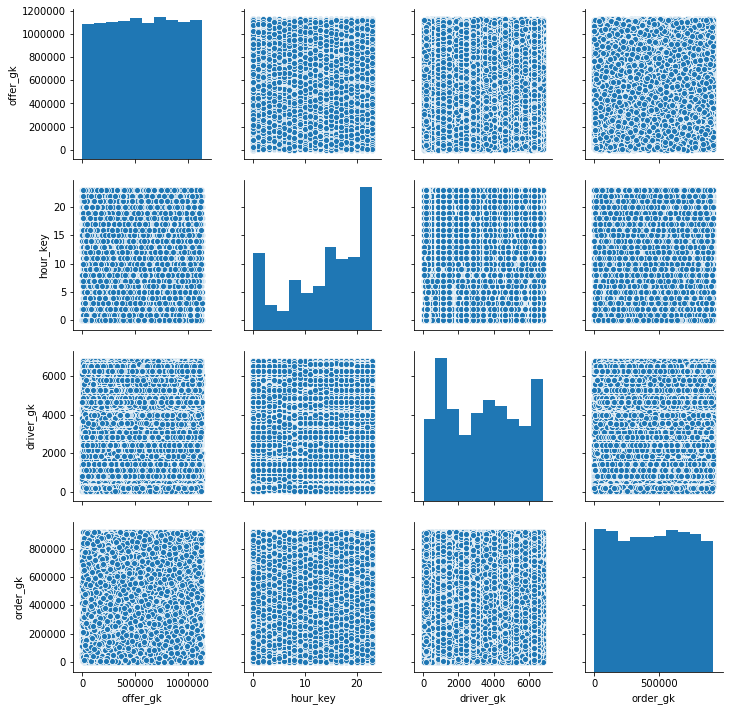

In [34]:
# теперь посмотрим на оставшиеся данные
test_columns_ncorr = ['offer_gk', 'hour_key', 'driver_gk', 'order_gk',
       'offer_class_group', 'ride_type_desc']
sns.pairplot(duration_zer_data[test_columns_ncorr])

In [35]:
duration_zer_data[test_columns_ncorr].corr()

,offer_gk,hour_key,driver_gk,order_gk
offer_gk,1.000,-0.009,0.002,0.004
hour_key,-0.009,1.000,-0.042,0.007
driver_gk,0.002,-0.042,1.000,-0.010
order_gk,0.004,0.007,-0.010,1.000


Посмотрим на данные, если driver_response = 0

In [36]:
duration_zer_data_driver_response1 = duration_zer_data[duration_zer_data['driver_response'] != 1]

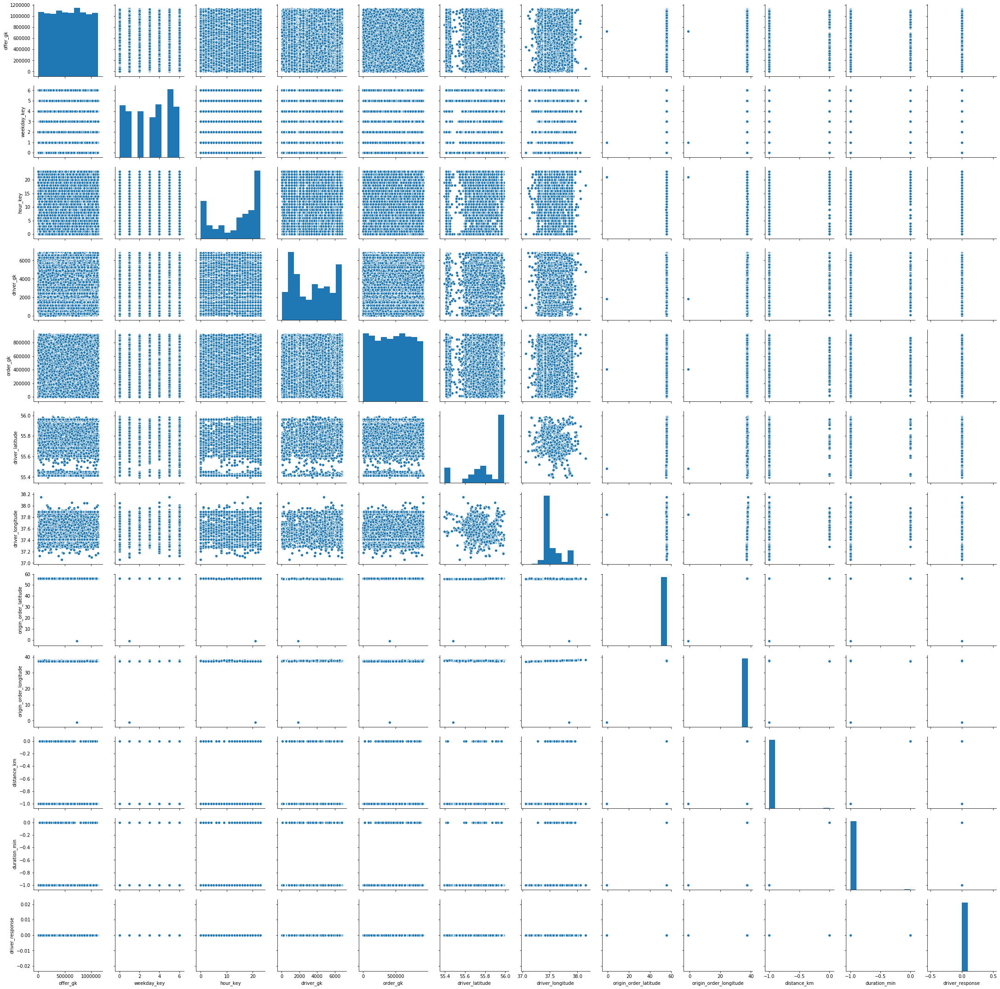

In [24]:
sns.pairplot(duration_zer_data_driver_response1)

**Отсеим и посмотрим: data[data['duration_min'] >0**

In [37]:
# отсеим и посмотрим duration_min
duration_min_data = data[data['duration_min'] >0]

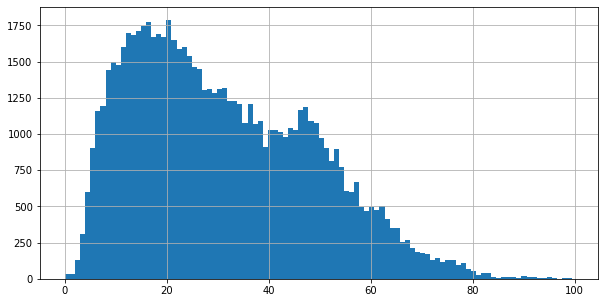

In [38]:
# посмотрим результат на гистограмме, если уберем аномалию (отсеим выброс -1) для duration_min. 
duration_min_data.loc[duration_min_data['duration_min'] <100,'duration_min'].hist(bins=100,figsize=(10,5))

**Отсеим и посмотрим: data[data['distance_km'] >0**

In [39]:
# отсеим и посмотрим distance_km
distance_km_data = data[data['distance_km'] >0]

In [40]:
# размер данных - отсеилось 26359 значений
distance_km_data.shape

(73641, 14)

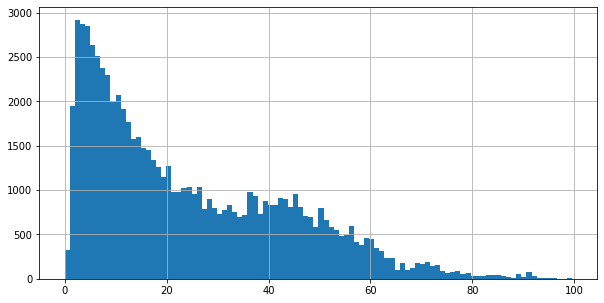

In [41]:
# посмотрим результат на гистограмме, если уберем аномалию (отсеим выброс -1 и 0) для distance_km. 
distance_km_data.loc[distance_km_data['distance_km'] <100,'distance_km'].hist(bins=100,figsize=(10,5))

In [42]:
# отсеим и посмотрим
m1_data = data[data['driver_latitude'] >0]

In [43]:
# размер данных - отсеилось 141 значений
m1_data.shape

(99859, 14)

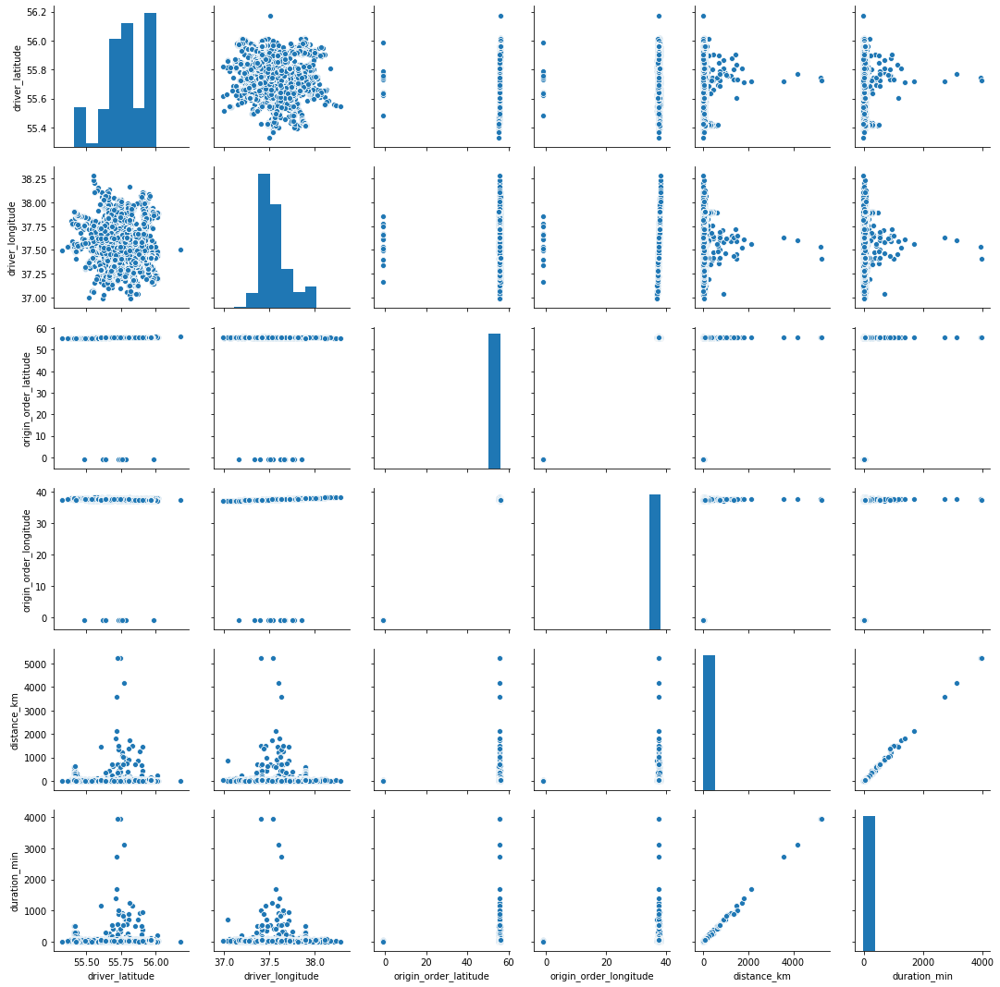

In [44]:
# теперь посмотрим на данные без аномалии -1
test_columns = ['driver_latitude','driver_longitude','origin_order_latitude','origin_order_longitude','distance_km','duration_min']
sns.pairplot(m1_data[test_columns])

In [46]:
# основные статистические характеристики данных 
# здесь мы добились хорошего минимума для driver_latitude и driver_longitude
m1_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
offer_gk,"99,859.000","566,181.343","325,936.131",4.000,"285,511.500","565,589.000","848,677.500","1,130,355.000"
weekday_key,"99,859.000",3.160,2.054,0.000,1.000,3.000,5.000,6.000
hour_key,"99,859.000",13.827,7.308,0.000,8.000,16.000,20.000,23.000
driver_gk,"99,859.000","3,445.101","2,038.574",14.000,"1,421.000","3,506.000","5,242.000","6,806.000"
order_gk,"99,859.000","460,906.440","266,045.592",18.000,"229,219.000","462,500.000","690,894.000","920,344.000"
driver_latitude,"99,859.000",55.781,0.154,55.328,55.709,55.773,55.961,56.174
driver_longitude,"99,859.000",37.547,0.157,36.985,37.413,37.534,37.624,38.281
origin_order_latitude,"99,859.000",55.773,0.666,-1.000,55.708,55.773,55.962,56.172
origin_order_longitude,"99,859.000",37.541,0.468,-1.000,37.407,37.532,37.624,38.244
distance_km,"99,859.000",18.411,41.149,-1.000,-1.000,10.441,30.686,"5,234.283"


In [47]:
# посмотрим аномалии - origin_order_latitude
m11_data = m1_data[m1_data['origin_order_latitude'] >0]

In [48]:
m1_data.shape

(99859, 14)

In [49]:
# размер данных - отсеилось всего 13 значений
m11_data.shape

(99846, 14)

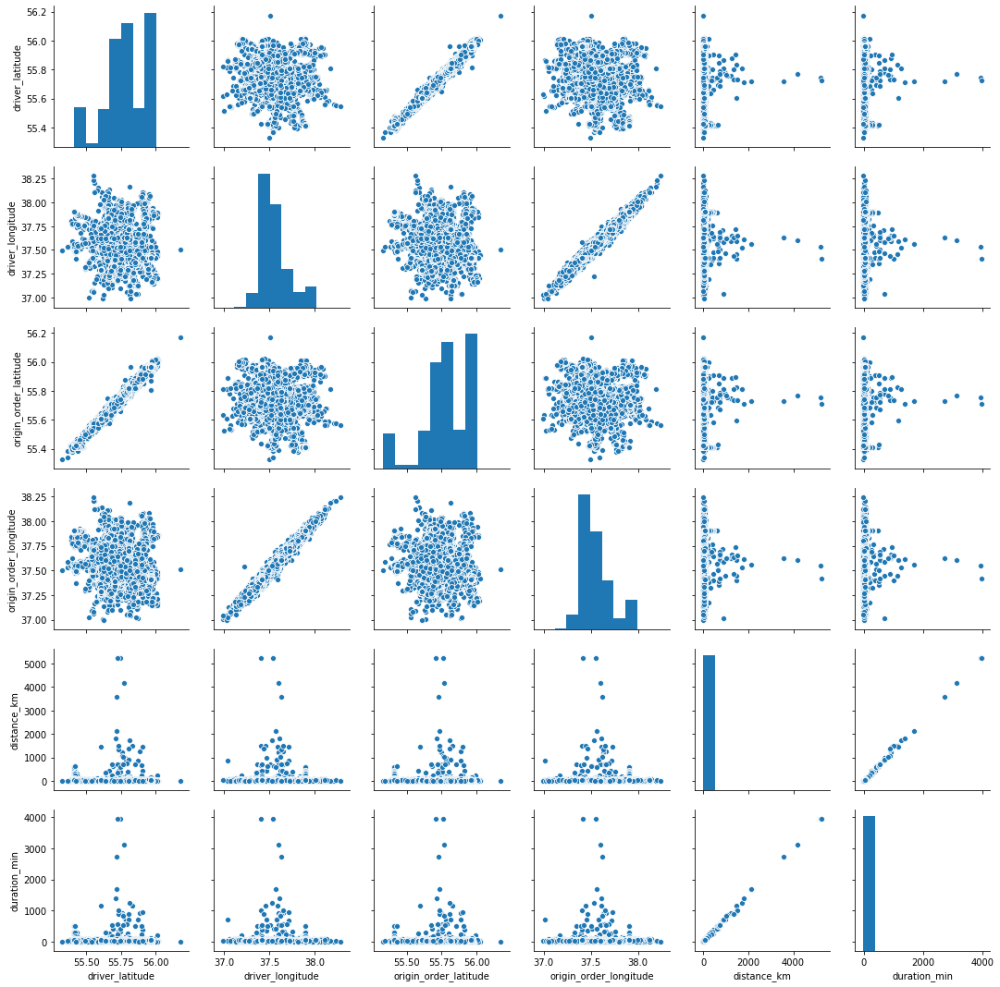

In [50]:
# теперь посмотрим на данные без аномалии -1 в признаках 'origin_order_latitude' и 'origin_order_longitude'
test_columns = ['driver_latitude','driver_longitude','origin_order_latitude','origin_order_longitude','distance_km','duration_min']
sns.pairplot(m11_data[test_columns])

In [51]:
# посмотрим аномалии - distance_km
m111_data = m11_data[m11_data['distance_km'] >0]

In [52]:
# размер данных - отсеилось 26083 значений
m111_data.shape

(73611, 14)

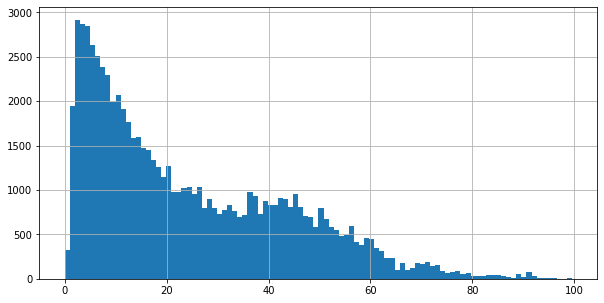

In [53]:
# посмотрим результат на гистограмме, если уберем аномалию (отсеим выброс -1 и 0) для distance_km. 
m111_data.loc[m111_data['distance_km'] <100,'distance_km'].hist(bins=100,figsize=(10,5))

In [54]:
# посмотрим аномалии - distance_km <100 
m4_data = m111_data[m111_data['distance_km'] <100]

In [55]:
# размер данных - отсеилось  еще 174 значения
m4_data.shape

(73437, 14)

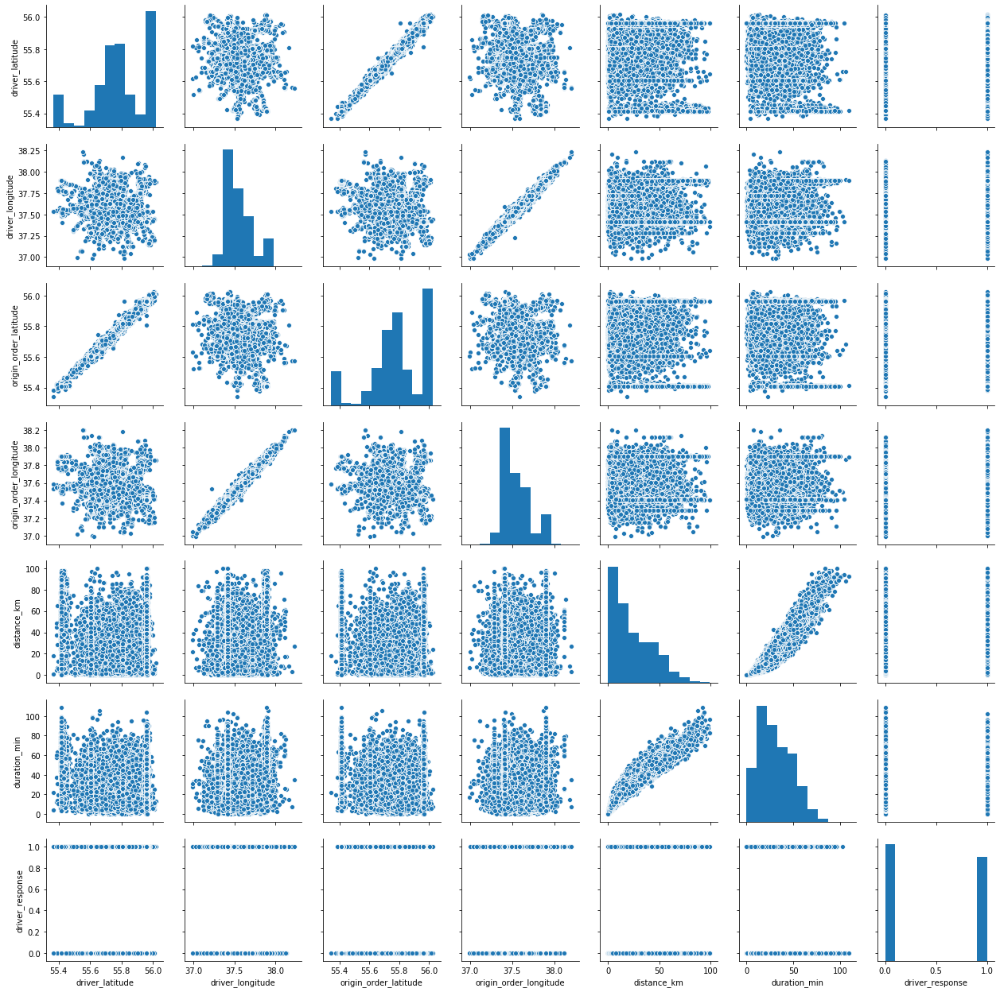

In [67]:
# теперь посмотрим на данные без аномалии -1 и < 100 в признаке 'distance_km'
test_columns = ['driver_latitude','driver_longitude','origin_order_latitude','origin_order_longitude','distance_km','duration_min','driver_response']
sns.pairplot(m4_data[test_columns])

 **Очевидно наличие связи между координатами - водитель старается выбрать начало маршрута ближе к себе:**
- (driver_latitude и origin_order_latitude)
- (driver_longitude и origin_order_longitude)

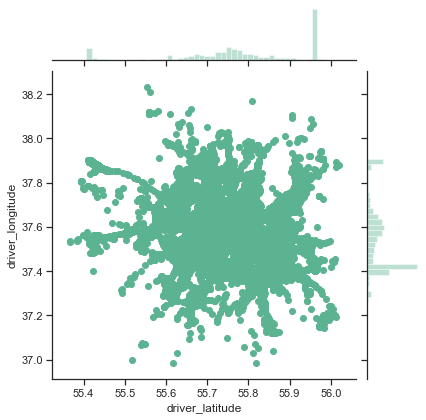

In [122]:
# 
sns.set(style="ticks")

sns.jointplot(m4_data['driver_latitude'], 
              m4_data['driver_longitude'], 
              kind="scatter", color="#5CB391")

**Очевидно наличие связи между расстоянием и временем поездки - водитель старается сократить как расстояние, так и время - потраченное на поездку:**
- (distance_km и duration_min)

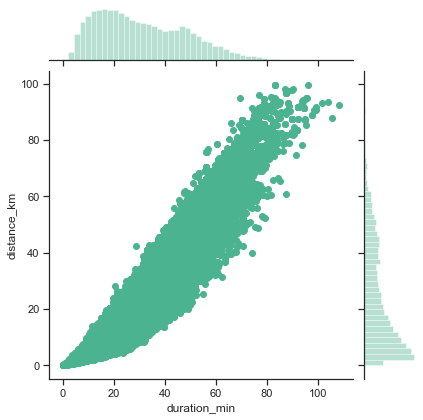

In [118]:
sns.set(style="ticks")

sns.jointplot(m4_data['duration_min'], 
              m4_data['distance_km'], 
              kind="scatter", color="#4CB391")

In [123]:
# основные статистические характеристики данных 
# здесь мы отсеили все аномалии по -1 и 0 и по всем максимумам
m4_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
offer_gk,"73,437.000","565,809.456","326,303.035",4.000,"284,896.000","564,858.000","849,673.000","1,130,355.000"
weekday_key,"73,437.000",3.150,2.078,0.000,1.000,3.000,5.000,6.000
hour_key,"73,437.000",13.805,7.313,0.000,8.000,16.000,20.000,23.000
driver_gk,"73,437.000","3,460.986","2,039.120",14.000,"1,421.000","3,507.000","5,246.000","6,806.000"
order_gk,"73,437.000","461,964.815","266,099.340",27.000,"230,587.000","463,374.000","692,504.000","920,344.000"
driver_latitude,"73,437.000",55.781,0.157,55.368,55.706,55.775,55.961,56.019
driver_longitude,"73,437.000",37.546,0.160,36.985,37.413,37.528,37.625,38.233
origin_order_latitude,"73,437.000",55.780,0.159,55.343,55.706,55.775,55.962,56.025
origin_order_longitude,"73,437.000",37.546,0.163,36.994,37.407,37.527,37.625,38.204
distance_km,"73,437.000",24.343,19.363,0.005,7.943,18.596,38.645,99.596


In [124]:
# типы данных дата-фрейма data
m4_data.info()
# nan данные в датафрейме отсутствуют

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73437 entries, 1 to 99999
Data columns (total 14 columns):
offer_gk                  73437 non-null int64
weekday_key               73437 non-null int64
hour_key                  73437 non-null int64
driver_gk                 73437 non-null int64
order_gk                  73437 non-null int64
driver_latitude           73437 non-null float64
driver_longitude          73437 non-null float64
origin_order_latitude     73437 non-null float64
origin_order_longitude    73437 non-null float64
distance_km               73437 non-null float64
duration_min              73437 non-null float64
offer_class_group         73437 non-null object
ride_type_desc            73437 non-null object
driver_response           73437 non-null int64
dtypes: float64(6), int64(6), object(2)
memory usage: 10.9+ MB


In [125]:
# получили первое значение info используя iloc[0]
# data.iloc[0]['offer_class_group']

## 4. Оценка зависимости переменных между собой
**(используем корреляции и profile_report)**

In [131]:
# оценка корреляционной матрицы данных
m4_data.corr()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,driver_response
offer_gk,1.000,-0.004,-0.006,0.001,0.003,-0.002,-0.006,-0.002,-0.005,0.003,0.003,0.005
weekday_key,-0.004,1.000,0.058,0.014,-0.001,-0.047,0.032,-0.045,0.031,-0.084,-0.077,0.042
hour_key,-0.006,0.058,1.000,-0.036,0.006,0.042,-0.029,0.044,-0.031,-0.061,-0.067,0.027
driver_gk,0.001,0.014,-0.036,1.000,-0.002,-0.156,0.120,-0.157,0.121,-0.042,-0.029,0.017
order_gk,0.003,-0.001,0.006,-0.002,1.000,0.008,-0.007,0.008,-0.008,-0.001,0.000,0.002
driver_latitude,-0.002,-0.047,0.042,-0.156,0.008,1.000,-0.702,0.999,-0.708,-0.009,-0.065,-0.189
driver_longitude,-0.006,0.032,-0.029,0.120,-0.007,-0.702,1.000,-0.704,0.996,0.046,0.110,0.155
origin_order_latitude,-0.002,-0.045,0.044,-0.157,0.008,0.999,-0.704,1.000,-0.710,-0.015,-0.070,-0.186
origin_order_longitude,-0.005,0.031,-0.031,0.121,-0.008,-0.708,0.996,-0.710,1.000,0.052,0.116,0.153
distance_km,0.003,-0.084,-0.061,-0.042,-0.001,-0.009,0.046,-0.015,0.052,1.000,0.957,-0.375


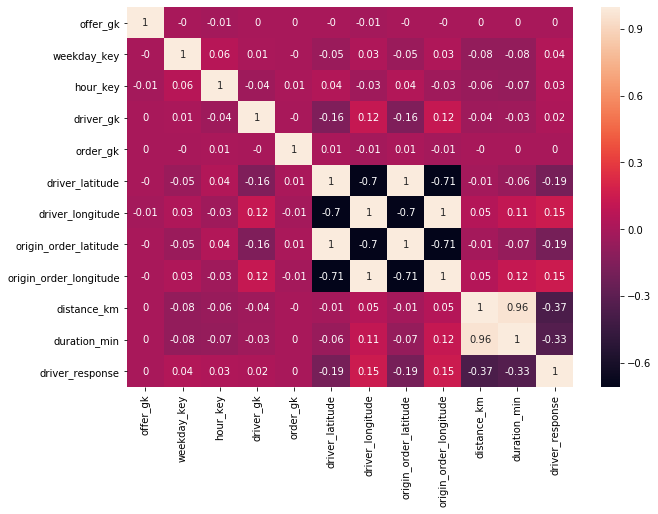

In [65]:
correlation_matrix =m4_data.corr().round(2)
# annot = True to print the values inside the square
fig, ax = plt.subplots(figsize=(10,7)) 
sns.heatmap(data=correlation_matrix, annot=True)

**Согласно корреляционной матрице m4_data.corr() (очищена от аномалий и выбросов) наши выводы (п.3) подтверждаются:**
- существует сильная связь между координатамии водителя (водитель старается работать в своем районе);
- также существует связь между координатами начала маршрута (часто заказывают такси приблизительно из одного и того же места);
- также существует сильная корреляционная связь между координатами водителя и координатами начала маршрута (водитель старается получить заказ поближе к себе);
- кроме того существует связь между расстоянием поездки и временем поездки (это два показателя которые водитель всегда интуитивно минимизирует).

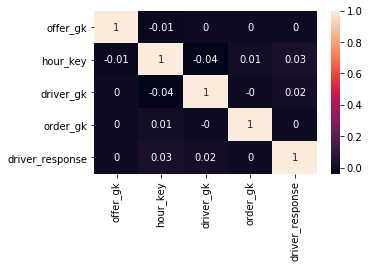

In [73]:
# теперь посмотрим на оставшиеся данные
test_columns_ncorr = ['offer_gk', 'hour_key', 'driver_gk', 'order_gk','offer_class_group', 'ride_type_desc','driver_response']
correlation_matrix =m4_data[test_columns_ncorr].corr().round(2)
# annot = True to print the values inside the square
fig, ax = plt.subplots(figsize=(5,3)) 
sns.heatmap(data=correlation_matrix, annot=True)

- Можно отметить низкую корреляционную связь следующих признаков - 'offer_gk', 'hour_key', 'driver_gk', 'order_gk' 

In [133]:
# profile_report

In [625]:
import pandas_profiling
m4_data.profile_report()

## 5. Преобразование категориальных признаков ##

**Категориальные признаки:**
- 'offer_class_group'- предложение класс группа
- 'ride_type_desc'- описание типа поездки

In [26]:
#  предложение класса услуги такси - из столбца выберем в массив уникальные значения 
data['offer_class_group'].unique()

array(['Economy', 'Standard', 'XL', 'Kids', 'Delivery', 'Test', 'Premium',
       'VIP', 'VIP+'], dtype=object)

In [27]:
# подсчет уникальных значений столбца данных offer_class_group(классы услуги в такси) - 
#всего 100 тыс. значений
data['offer_class_group'].value_counts().head(10)

Economy     48335
Standard    47288
Premium      1773
Delivery     1290
Kids          588
XL            464
VIP           225
VIP+           29
Test            8
Name: offer_class_group, dtype: int64

- существует 9 классов услуги такси;
- наибольшее число поездок производится в классах Economy и Standard;
- наименьшее число поездок производится в классах Test и VIP+;
- существуют пары классов мало различимые по числу поездок (Economy и Standard), (Premium и Delivery), (Kids и XL)

In [28]:
#  описание типа поездки - из столбца выберем в массив уникальные значения 
data['ride_type_desc'].unique()

array(['private', 'business', 'affiliate', 'SMB'], dtype=object)

In [29]:
# подсчет уникальных значений столбца данных ride_type_desc (описание типа поездки) - всего 100 тыс. значений
data['ride_type_desc'].value_counts().head()

private      91207
business      8533
affiliate      224
SMB             36
Name: ride_type_desc, dtype: int64

- существует 4 типа поездки (private, business, affiliate, SMB);
- наиболее частая поездка - private, она в десять раз популярнее всех остальных вместе взятых.

- какие останутся типы поездок в отфильтрованных данных ?

In [57]:
m4_data['ride_type_desc'].value_counts().head()

private     73265
business      153
SMB            19
Name: ride_type_desc, dtype: int64

- Исчезли поездки affiliate и часть SMB. Видимо, именно они вносили аномалии в данные.
- При удалении выбросов (-1 и 0) и аномальных максимумов - меняется количество поездок и исчезает тип поездки affiliate (сетевые партнеры, дочерние компании). Может именно дочерние компании вносят некоторую аномалию в работу такси (как гипотеза)

- Какие классы услуг остались в отфильтрованных данных?

In [58]:
m4_data['offer_class_group'].value_counts().head(10)

Economy     40648
Standard    29785
Premium       996
Delivery      884
Kids          567
XL            442
VIP           104
VIP+           11
Name: offer_class_group, dtype: int64

- Полностью исчез только тестовый класс поездок - Test. 

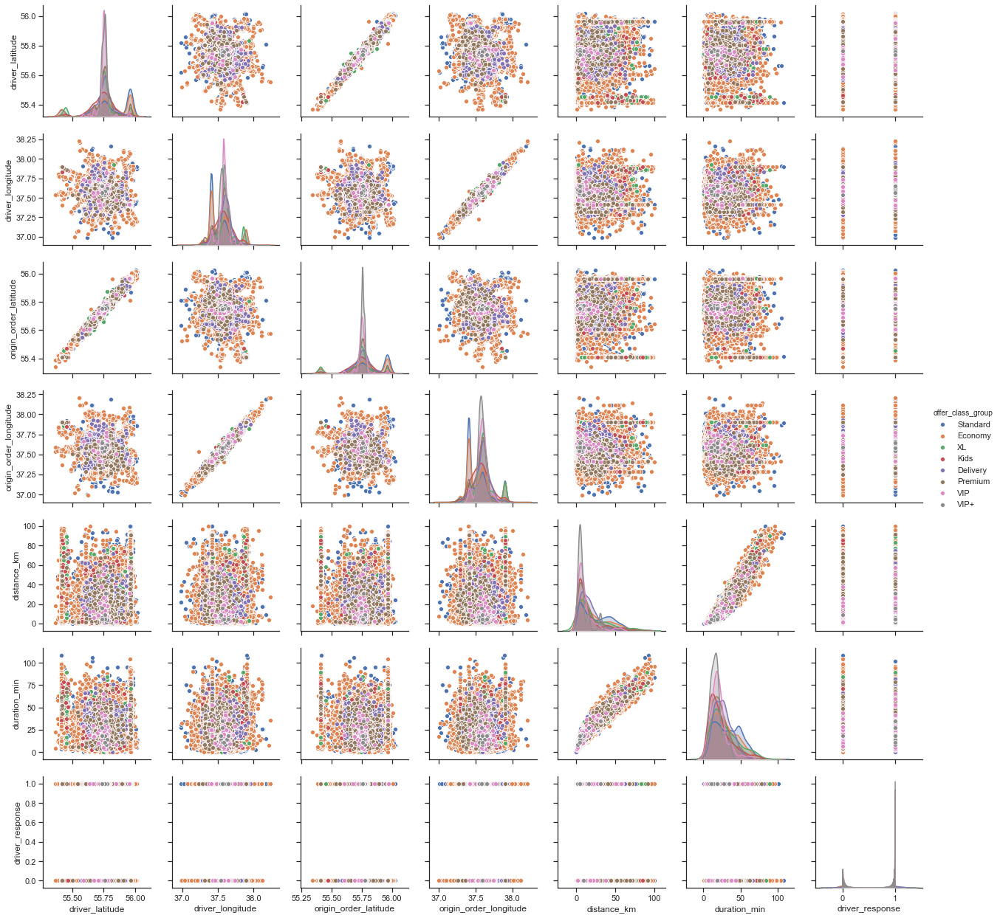

In [461]:
test_columns_corr = ['driver_latitude','driver_longitude','origin_order_latitude','origin_order_longitude','distance_km','duration_min','offer_class_group','driver_response']
fig = sns.pairplot(data=m4_data[test_columns_corr], hue='offer_class_group')
plt.show()

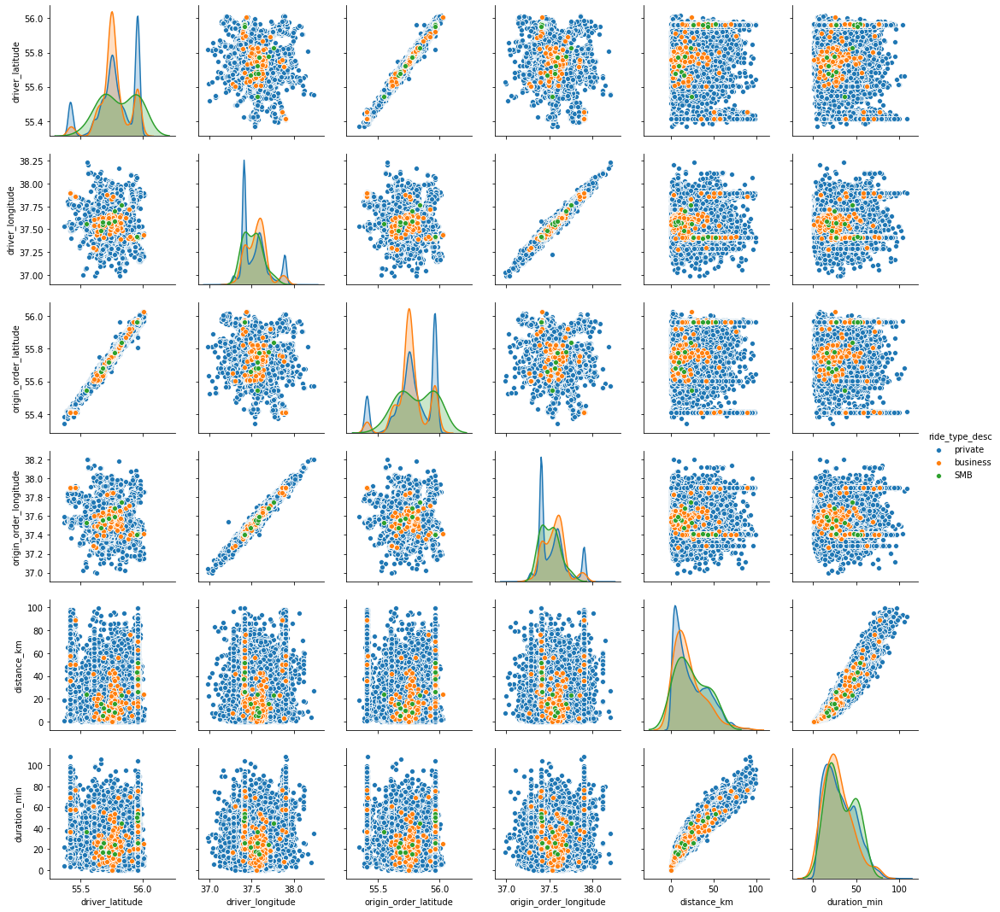

In [62]:
test_columns_corr = ['driver_latitude','driver_longitude','origin_order_latitude','origin_order_longitude','distance_km','duration_min','ride_type_desc','driver_response']
fig = sns.pairplot(data=m4_data[test_columns_corr], hue='ride_type_desc')
plt.show()

Плотность распределения данных (для business) локализована в меньшем объеме (практически по всем признакам). Что может указывать на определенные маршруты движения и сформировавшийся кластер обслуживания business (оранжевые данные). При этом у business короче маршруты и меньший разброс данных как по расстоянию, так и по времени поездки.


In [74]:
# просмотрим аномалии - distance_km <25 
distance_25km_data = m4_data[m4_data['distance_km'] <25]

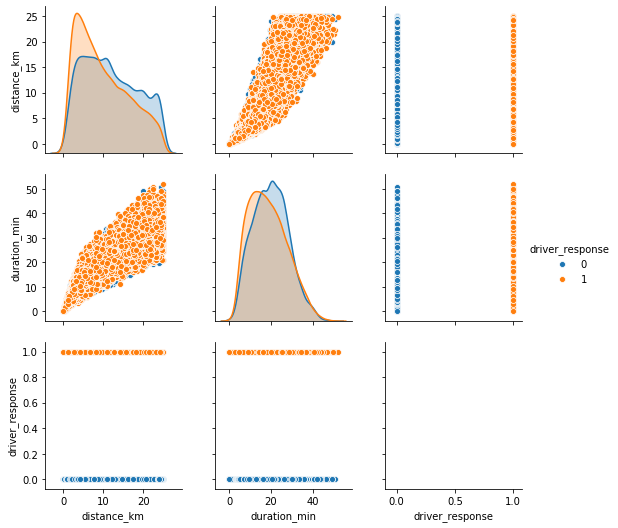

In [75]:
test_columns_corr = ['distance_km','duration_min','offer_class_group','driver_response']
fig = sns.pairplot(data=distance_25km_data[test_columns_corr], hue='driver_response')
plt.show()

In [463]:
len(distance_25km_data)

43722

In [464]:
len(distance_ater_25km_data)

29712

In [76]:
# посмотрим аномалии - distance_km >25 
distance_ater_25km_data = m4_data[m4_data['distance_km'] >25]

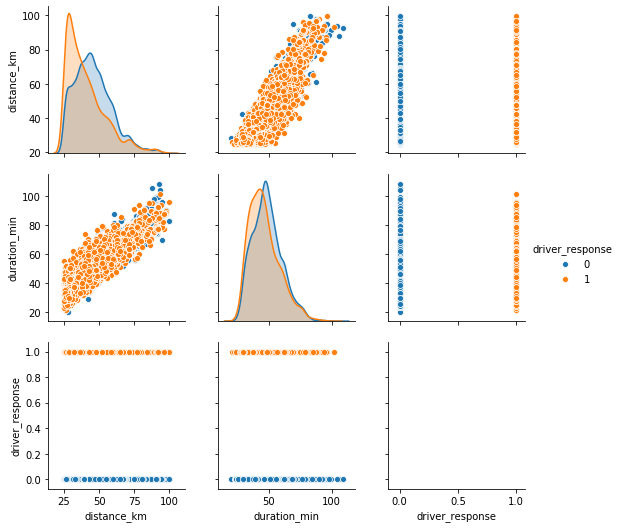

In [77]:
test_columns_corr = ['distance_km','duration_min','offer_class_group','driver_response']
fig = sns.pairplot(data=distance_ater_25km_data[test_columns_corr], hue='driver_response')
plt.show()

In [78]:
# ЗАКАЗ ВЫБРАН
# посмотрим data при  driver_response = 1
driver_response_1_data = m4_data[m4_data['driver_response'] == 1]

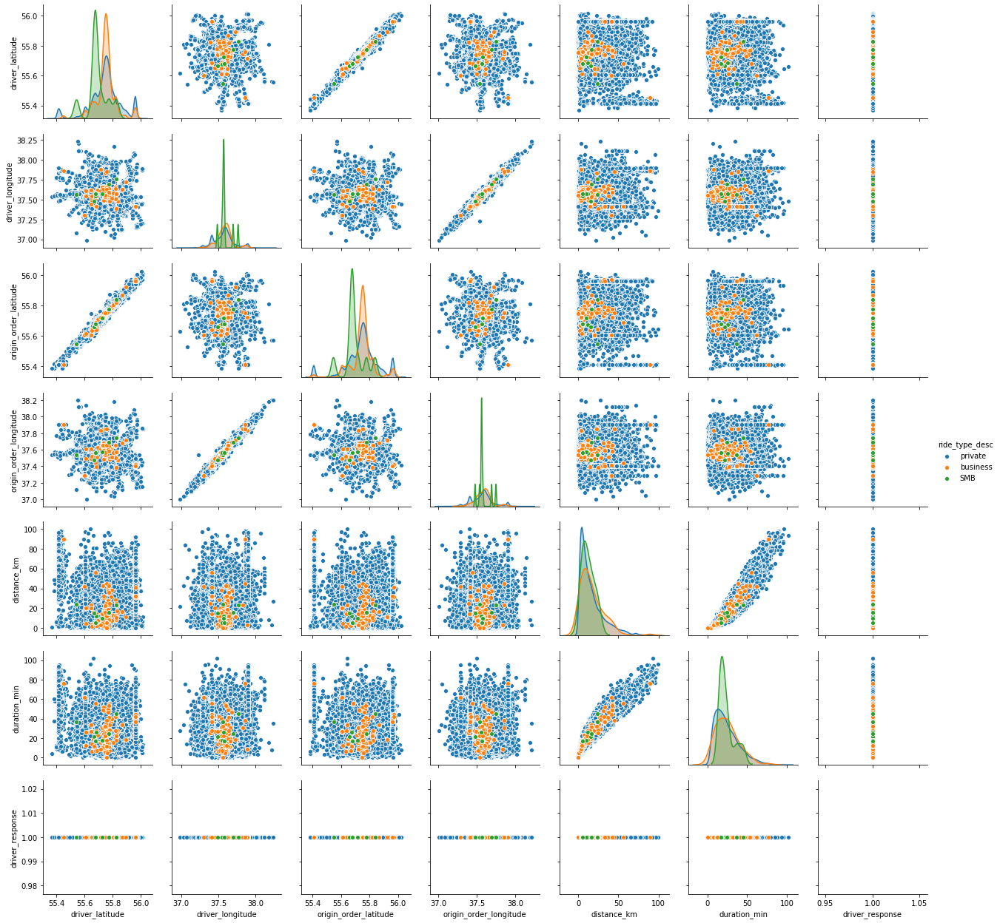

In [80]:
test_columns_corr = ['driver_latitude','driver_longitude','origin_order_latitude','origin_order_longitude','distance_km','duration_min','ride_type_desc','driver_response']
fig = sns.pairplot(data=driver_response_1_data[test_columns_corr], hue='ride_type_desc')
plt.show()

In [81]:
# ЗАКАЗ НЕ ВЫБРАН
# посмотрим data при  driver_response = 0
driver_response_0_data = m4_data[m4_data['driver_response'] == 0]

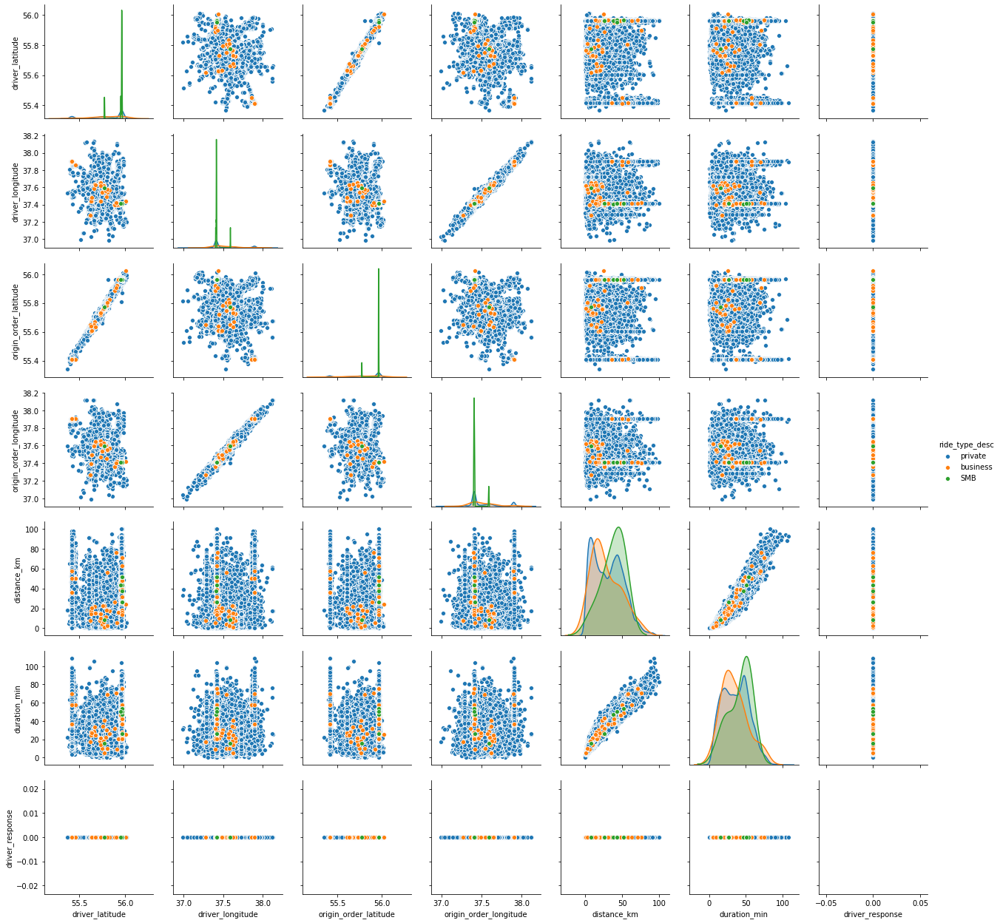

In [82]:
test_columns_corr = ['driver_latitude','driver_longitude','origin_order_latitude','origin_order_longitude','distance_km','duration_min','ride_type_desc','driver_response']
fig = sns.pairplot(data=driver_response_0_data[test_columns_corr], hue='ride_type_desc')
plt.show()

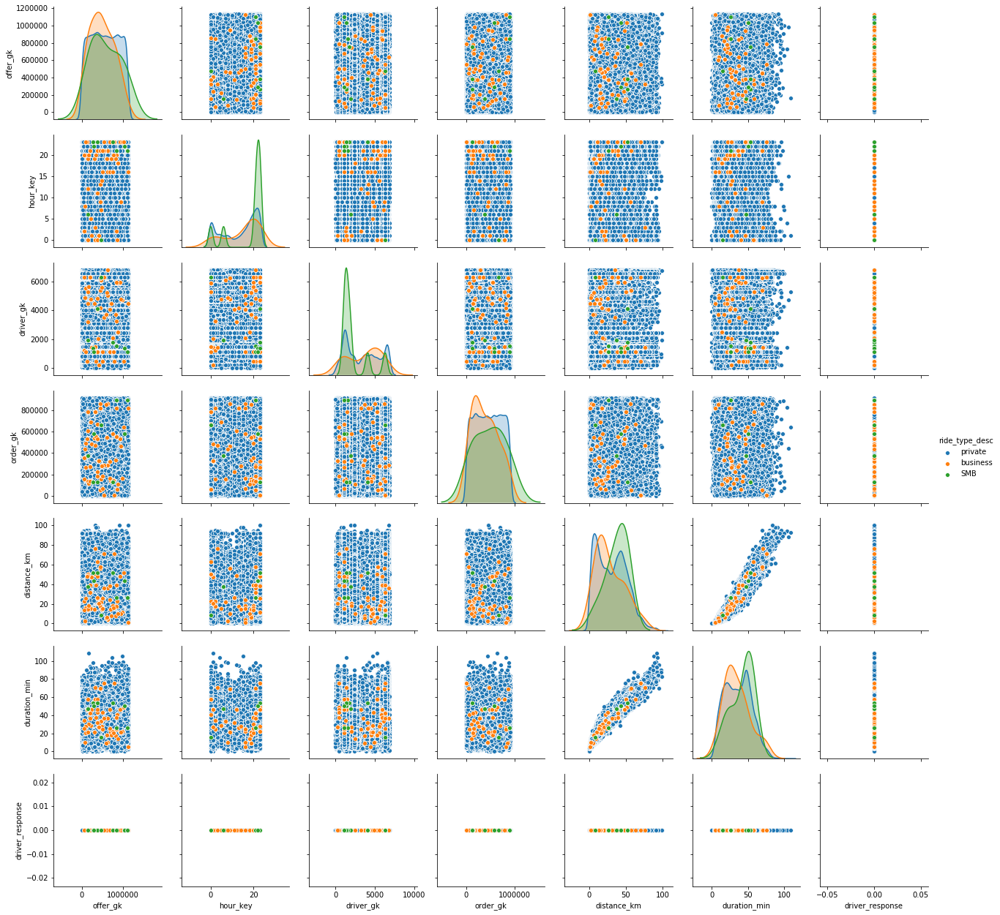

In [84]:
# ЗАКАЗ НЕ ВЫБРАН
# В этом случае водитель не выбрал заказ
test_columns_corr = ['offer_gk', 'hour_key', 'driver_gk', 'order_gk','offer_class_group','distance_km','duration_min','ride_type_desc','driver_response']
fig = sns.pairplot(data=driver_response_0_data[test_columns_corr], hue='ride_type_desc')
plt.show()

- водитель часто не выбирает заказ, если ехать далеко (около 50 км) и если время поездки больше 50 минут;
- при этом часто не выбирает бизнес-поездки на короткие расстояния.

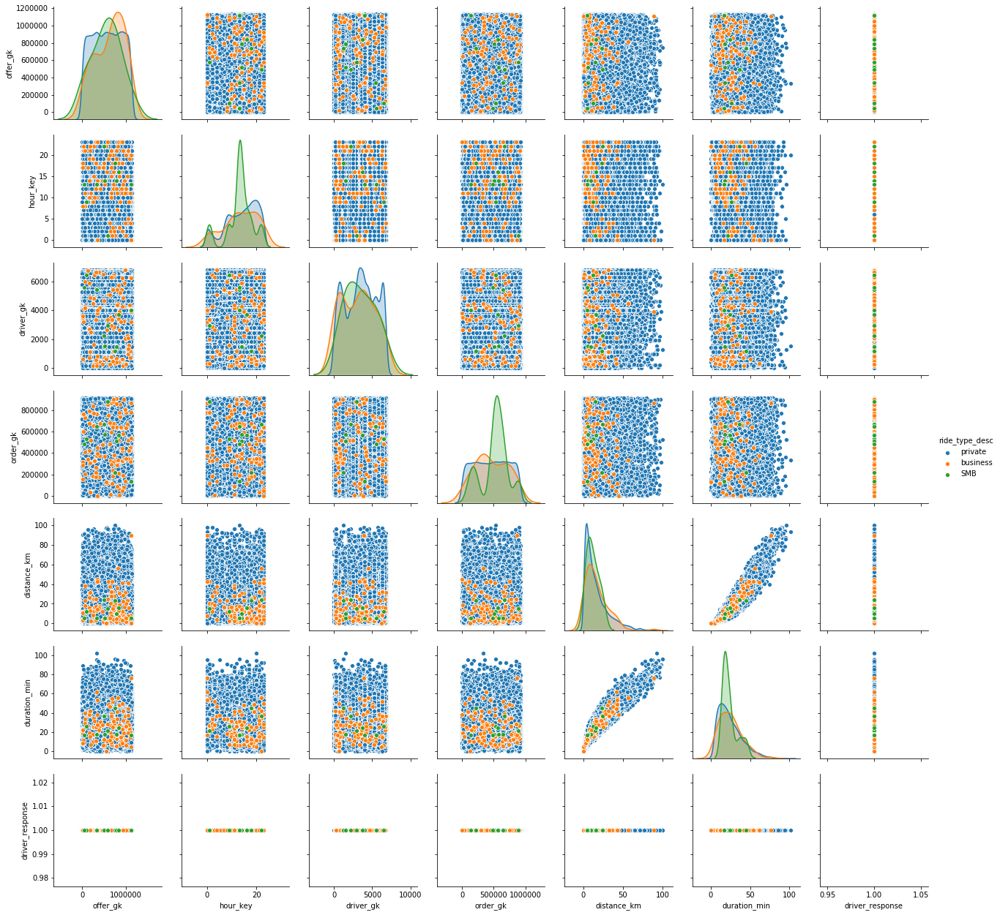

In [85]:
# ЗАКАЗ ВЫБРАН
# В этом случае водитель заказ выбрал
test_columns_corr = ['offer_gk', 'hour_key', 'driver_gk', 'order_gk','offer_class_group','distance_km','duration_min','ride_type_desc','driver_response']
fig = sns.pairplot(data=driver_response_1_data[test_columns_corr], hue='ride_type_desc')
plt.show()

- водитель чаще выбирает заказ, когда надо ехать не далеко (около 20 км)

In [134]:
# Очищенные данные - без аномалий и выбросов:
m4_data.head()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
1,759733,5,14,6080,358774,55.805,37.515,55.819,37.466,18.802,25.217,Standard,private,1
2,416977,6,14,6080,866260,55.814,37.348,55.815,37.354,6.747,9.800,Economy,private,0
4,1120055,4,16,6080,506710,55.804,37.522,55.813,37.527,12.383,19.250,Economy,private,1
5,1058203,6,15,6080,360328,55.819,37.361,55.815,37.354,6.747,9.800,Economy,private,0
7,128861,5,20,6080,254374,55.839,37.249,55.839,37.304,1.517,3.933,Economy,private,0


## 6. Работа с категориальными переменными

In [136]:
# Кодируем категориальные переменные
labelEnc = LabelEncoder()
columns_for_encode = ["offer_class_group", "ride_type_desc"]
for column in columns_for_encode:
    m4_data[column + "_enc"] = labelEnc.fit_transform(m4_data[column])
    
m4_data.sample(7)

/Users/louisxvi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response,offer_class_group_enc,ride_type_desc_enc
67970,127405,3,17,1064,456422,55.776,37.585,55.783,37.576,2.868,7.400,Delivery,private,1,0,2
96211,954376,3,22,1126,186922,55.779,37.585,55.779,37.589,16.631,24.017,Economy,private,0,1,2
79302,1119277,1,20,762,330099,55.888,37.427,55.897,37.450,26.997,31.867,Economy,private,0,1,2
53939,144845,1,16,2433,613774,55.773,37.651,55.767,37.641,7.428,19.533,Standard,private,1,4,2
79213,302783,2,7,4652,891705,55.806,37.718,55.810,37.705,21.686,32.633,Economy,private,1,1,2
90140,471120,4,8,6709,165389,55.608,37.293,55.600,37.271,10.388,20.567,Economy,private,1,1,2
13657,572204,3,20,2291,540772,55.962,37.408,55.962,37.407,45.173,55.967,Standard,private,0,4,2


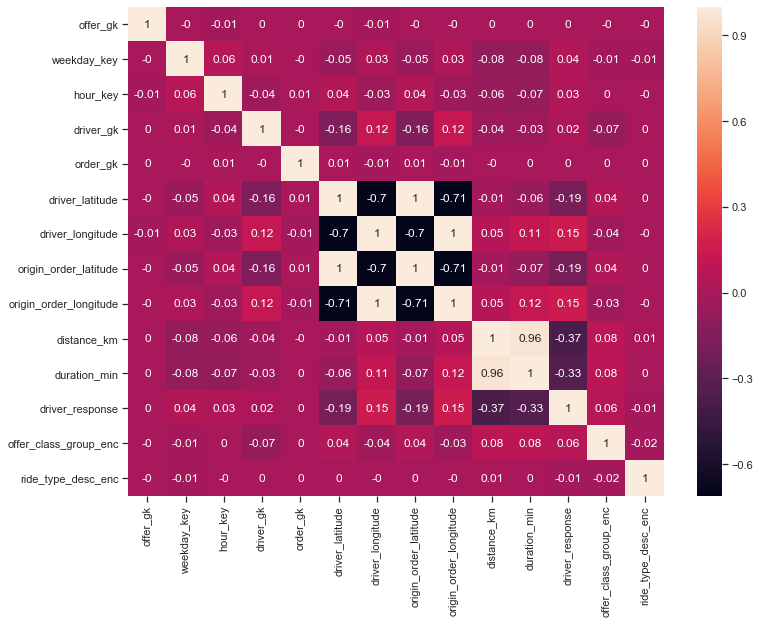

In [139]:
# Получим корреляционную матрицу всех признаков (с учетом целевого показателя)
correlation_matrix =m4_data.corr().round(2)
# annot = True to print the values inside the square
fig, ax = plt.subplots(figsize=(12,9)) 
sns.heatmap(data=correlation_matrix, annot=True)

**Корреляционная матрица показыват существенную корреляционную связь почти половины признаков рассматриваемых данных - m4_data**

## 7. Модели RandomForestRegressor

**Построение модели №1**

In [668]:
# Все колонки набора данных
m4_data.columns

Index(['offer_gk', 'weekday_key', 'hour_key', 'driver_gk', 'order_gk',
       'driver_latitude', 'driver_longitude', 'origin_order_latitude',
       'origin_order_longitude', 'distance_km', 'duration_min',
       'offer_class_group', 'ride_type_desc', 'driver_response',
       'offer_class_group_enc', 'ride_type_desc_enc'],
      dtype='object')

In [669]:
# Колонки для исключения из тренировочного набора данных ('offer_gk')
# Надо не забыть колонки обозначенные выше -  columns_for_encode
del_cols = (['offer_gk'])
# Колонка для прогнозирования
target_col = ['driver_response']
# Итоговый датафрейм для обучения
df2 = m4_data.drop(columns_for_encode + del_cols, axis = 1)
df2.sample(7)

,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,driver_response,offer_class_group_enc,ride_type_desc_enc
31147,4,21,6290,11331,55.416,37.898,55.410,37.902,61.372,69.100,0,1,2
83582,4,19,2038,737577,55.877,37.450,55.886,37.428,44.251,47.633,1,4,2
80626,6,17,3180,375744,55.675,37.527,55.686,37.543,5.089,10.400,1,1,2
47104,4,8,1244,355867,55.695,37.567,55.691,37.540,17.877,28.867,0,4,2
19351,5,19,5482,174856,55.911,37.392,55.899,37.409,1.116,4.533,0,1,2
3415,2,23,4269,288266,55.962,37.410,55.963,37.406,58.952,67.583,0,1,2
10621,6,23,6580,691305,55.880,37.421,55.891,37.381,3.400,7.933,0,4,2


**Назначим признаки и целевой показатель.** 

In [670]:
# Делим очищенные и преобразованные данные (df2) на признаки и целевой показатель
x_columns =[x for x in df2.columns if x != 'driver_response']
X = df2[x_columns]
y = df2.loc[:,['driver_response']].iloc[:,0].values

**Построим модель на всех этих признаках** 
(используем избыточные данные для модели - существует высокая корреляция между некоторыми признаками)

In [671]:
# Делим данные на обучающую (80% данных) и тестовую (20% данных) выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 42)

In [672]:
# Создаем модель деревья решений
# Выбираем 100 деревьев в качестве параметра
model=RandomForestRegressor(n_estimators=100)

# Обучаем модель
model.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

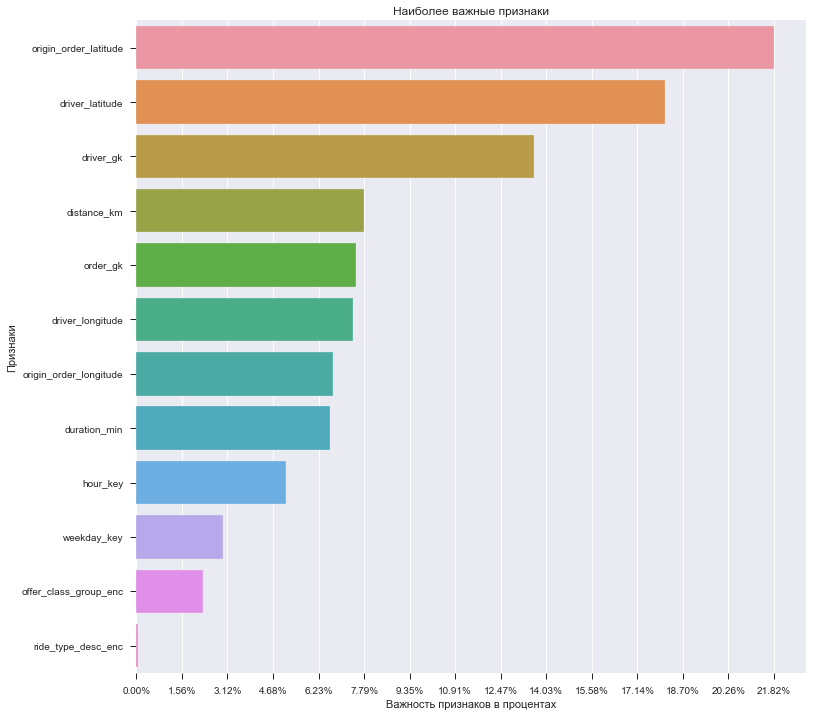

,0
origin_order_latitude,0.218
driver_latitude,0.181
driver_gk,0.136
distance_km,0.078
order_gk,0.075
driver_longitude,0.074
origin_order_longitude,0.067
duration_min,0.066
hour_key,0.051
weekday_key,0.030


In [673]:
headers = list(X_train.columns.values)
# Важность признаков
feature_imp = pd.Series(model.feature_importances_,index=headers).sort_values(ascending=False)

f, ax = plt.subplots(figsize=(12, 12))
sns.barplot(x=feature_imp, y=feature_imp.index)
x_ticks = np.linspace(start = 0, stop=max(feature_imp), num =  15, endpoint = True)
plt.xticks(x_ticks, [f"{x:0.2%}" for x in x_ticks])
plt.xlabel('Важность признаков в процентах')
plt.ylabel('Признаки')
plt.title("Наиболее важные признаки")

# Важность признаков на графике
plt.show()
# Важность признаков (численные значения)
pd.DataFrame(feature_imp)

In [674]:
# Реальные значения driver_response и предсказанные (Prediction)

# Значения y из тестовой выборки 
y_vals = pd.DataFrame({"driver_response":y_test})
#print(y_vals['driver_response'])

# Предсказанные значения
y_vals["Prediction"] = model.predict(X_test).tolist()
y_vals.sort_values(by="driver_response", inplace= True)
 
y_vals.sample(3)

,driver_response,Prediction
13111,0,0.000
7243,1,0.950
926,0,0.270


In [675]:
# Метрики предсказания модели
from sklearn.metrics import explained_variance_score
from sklearn.metrics import max_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import median_absolute_error
from sklearn.metrics import r2_score

regression_metrics = ([
    "explained_variance_score",
    "max_error",
    "mean_absolute_error",
    "mean_squared_error",
    "mean_squared_log_error",
    "median_absolute_error",
    "r2_score"
])
metrics = {}
for metric in regression_metrics:
    result = globals()[metric](y_vals.iloc[:,0].values, y_vals.iloc[:,1].values)
    metrics[metric] = result    
# Выведем метрики
pd.DataFrame(metrics, index=[0]).T

,0
explained_variance_score,0.465
max_error,1.000
mean_absolute_error,0.267
mean_squared_error,0.133
mean_squared_log_error,0.065
median_absolute_error,0.190
r2_score,0.465


**Точность модели №1 (с учетом избыточного количества признаков) неудовлетворительная = 0,466**

**Построение модели №2** 

In [616]:
# Проверим все колонки очищенных и подготовленных данных
m4_data.columns

Index(['offer_gk', 'weekday_key', 'hour_key', 'driver_gk', 'order_gk',
       'driver_latitude', 'driver_longitude', 'origin_order_latitude',
       'origin_order_longitude', 'distance_km', 'duration_min',
       'offer_class_group', 'ride_type_desc', 'driver_response',
       'offer_class_group_enc', 'ride_type_desc_enc'],
      dtype='object')

In [661]:
# Колонки для исключения из тренировочного набора данных:
del_cols = (['ride_type_desc_enc', 
             'order_gk',
             'offer_gk', 
             'duration_min',
             'weekday_key',
             'distance_km'])
# Колонка для прогнозирования
target_col = ['driver_response']
# Итоговый датафрейм для обучения
df2 = m4_data.drop(columns_for_encode + del_cols, axis = 1)
df2.sample(7)

,hour_key,driver_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,driver_response,offer_class_group_enc
40593,0,1421,55.961,37.413,55.961,37.404,0,1
27240,16,2381,55.827,37.528,55.822,37.531,0,1
42505,23,5925,55.962,37.407,55.962,37.407,0,4
52647,23,3686,55.775,37.621,55.776,37.593,0,4
38856,20,1421,55.961,37.414,55.967,37.416,0,1
34621,16,5242,55.689,37.571,55.692,37.566,1,1
56766,12,5236,55.739,37.657,55.740,37.656,0,4


**Назначим признаки и целевой показатель:**

In [662]:
# Делим очищенные и преобразованные данные (df2) на признаки и целевой показатель
x_columns =[x for x in df2.columns if x != 'driver_response']
X = df2[x_columns]
y = df2.loc[:,['driver_response']].iloc[:,0].values

In [663]:
# Делим данные на обучающую (80% данных) и тестовую (20% данных) выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 42)

In [664]:
# Создаем модель деревья решений
# Выбираем 100 деревьев в качестве параметра
model=RandomForestRegressor(n_estimators=100)

# Обучаем модель
model.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

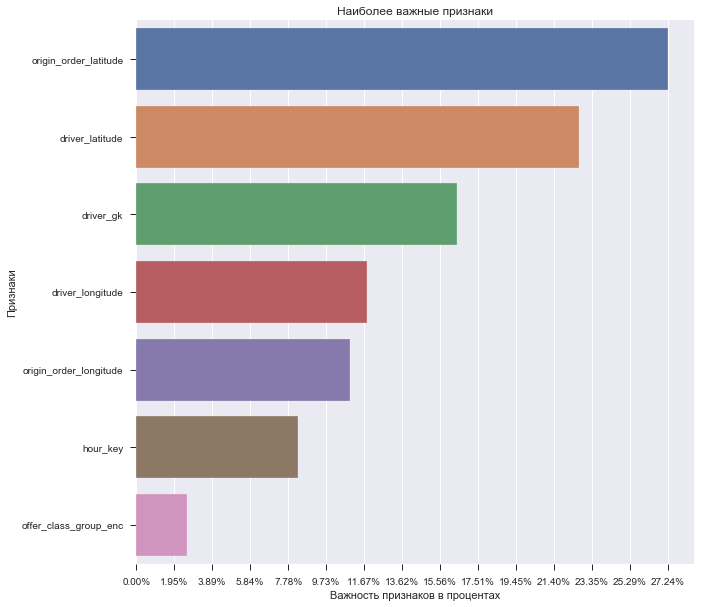

,0
origin_order_latitude,0.272
driver_latitude,0.227
driver_gk,0.164
driver_longitude,0.118
origin_order_longitude,0.110
hour_key,0.083
offer_class_group_enc,0.026


In [665]:
headers = list(X_train.columns.values)
# Важность признаков
feature_imp = pd.Series(model.feature_importances_,index=headers).sort_values(ascending=False)
f, ax = plt.subplots(figsize=(10, 10))
sns.barplot(x=feature_imp, y=feature_imp.index)
x_ticks = np.linspace(start = 0, stop=max(feature_imp), num =  15, endpoint = True)
plt.xticks(x_ticks, [f"{x:0.2%}" for x in x_ticks])
plt.xlabel('Важность признаков в процентах')
plt.ylabel('Признаки')
plt.title("Наиболее важные признаки")
# Важность на графике
plt.show()
# Наиболее важные признаки (Численные значения)
pd.DataFrame(feature_imp)

In [666]:
# Реальные значения driver_response и предсказанные (Prediction)

# Значения y из тестовой выборки 
y_vals = pd.DataFrame({"driver_response":y_test})

# Предсказанные значения
y_vals["Prediction"] = model.predict(X_test).tolist()
y_vals.sort_values(by="driver_response", inplace= True)

# Абсолютная ошибка
delt =(y_vals['driver_response'] - y_vals['Prediction']).abs().sum()/len(y_vals)
print(delt)
y_vals.sample(7)

0.2587423116117812


,driver_response,Prediction
9005,0,0.160
3982,1,0.016
12481,1,0.480
3957,0,0.020
7882,0,0.190
2126,1,0.910
3138,1,0.940


In [667]:
# Метрики предсказания модели
from sklearn.metrics import explained_variance_score
from sklearn.metrics import max_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import median_absolute_error
from sklearn.metrics import r2_score
regression_metrics = ([
    "explained_variance_score",
    "max_error",
    "mean_absolute_error",
    "mean_squared_error",
    "mean_squared_log_error",
    "median_absolute_error",
    "r2_score"
])
metrics = {}
for metric in regression_metrics:
    result = globals()[metric](y_vals.iloc[:,0].values, y_vals.iloc[:,1].values)
    metrics[metric] = result
# Выведем метрики
pd.DataFrame(metrics, index=[0]).T

,0
explained_variance_score,0.441
max_error,1.000
mean_absolute_error,0.259
mean_squared_error,0.139
mean_squared_log_error,0.068
median_absolute_error,0.160
r2_score,0.441


**Точность модели №2 еще скромнее)) неудовлетворительная = 0,441**

**Построение модели №3**

In [653]:
# Удалим лишь колонки обозначенные выше -  columns_for_encode
# Итоговый датафрейм для обучения
df2 = m4_data.drop(columns_for_encode, axis = 1)
df2.sample(7)

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,driver_response,offer_class_group_enc,ride_type_desc_enc
29553,679935,4,14,1060,641330,55.962,37.407,55.962,37.407,23.525,25.700,0,1,2
4467,1016362,2,19,5187,729080,55.816,37.707,55.818,37.702,6.216,14.050,1,2,2
15025,577891,5,18,3860,899104,55.809,37.559,55.811,37.561,14.505,28.317,0,4,2
39098,610109,6,21,1421,337118,55.961,37.413,55.962,37.407,36.674,50.917,0,4,2
49100,167095,5,1,211,714622,55.415,37.899,55.410,37.902,29.850,34.150,1,1,2
58614,592240,4,18,5651,486925,55.794,37.587,55.797,37.562,0.938,3.617,1,4,2
77487,1081116,2,10,5246,224719,55.734,37.626,55.741,37.629,6.177,12.267,1,1,2


In [654]:
# Делим очищенные и преобразованные данные (df2) на признаки и целевой показатель
x_columns =[x for x in df2.columns if x != 'driver_response']
X = df2[x_columns]
y = df2.loc[:,['driver_response']].iloc[:,0].values

In [655]:
# Делим данные на обучающую (80% данных) и тестовую (20% данных) выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 42)

In [656]:
# Создаем модель деревья решений
# Выбираем 100 деревьев в качестве параметра
model=RandomForestRegressor(n_estimators=100)

# Обучаем модель
model.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

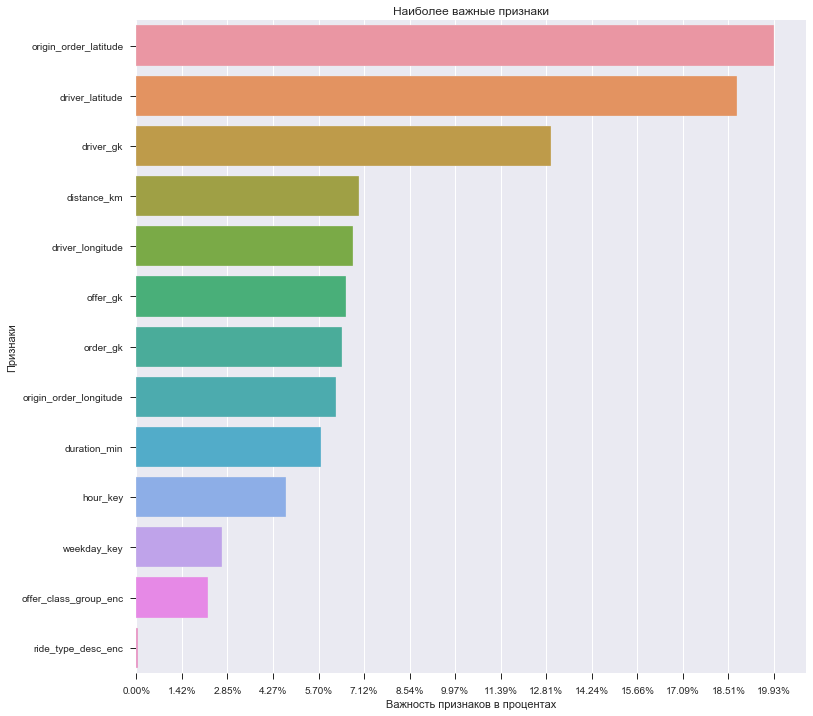

,0
origin_order_latitude,0.199
driver_latitude,0.188
driver_gk,0.130
distance_km,0.070
driver_longitude,0.068
offer_gk,0.065
order_gk,0.064
origin_order_longitude,0.062
duration_min,0.058
hour_key,0.047


In [657]:
headers = list(X_train.columns.values)
# Важность признаков
feature_imp = pd.Series(model.feature_importances_,index=headers).sort_values(ascending=False)
f, ax = plt.subplots(figsize=(12, 12))
sns.barplot(x=feature_imp, y=feature_imp.index)
x_ticks = np.linspace(start = 0, stop=max(feature_imp), num =  15, endpoint = True)
plt.xticks(x_ticks, [f"{x:0.2%}" for x in x_ticks])
plt.xlabel('Важность признаков в процентах')
plt.ylabel('Признаки')
plt.title("Наиболее важные признаки")
# Важность на графике
plt.show()
# И в DataFrame
pd.DataFrame(feature_imp)

In [658]:
# Реальные значения driver_response и предсказанные (Prediction)

# Значения y из тестовой выборки 
y_vals = pd.DataFrame({"driver_response":y_test})

# Предсказанные значения
y_vals["Prediction"] = model.predict(X_test).tolist()
y_vals.sort_values(by="driver_response", inplace= True)

# Абсолютная ошибка
delt = (y_vals['driver_response'] - y_vals['Prediction']).abs().sum()/len(y_vals)
print('Абсолютная ошибка: ',delt)

y_vals.sample(7)

Абсолютная ошибка:  0.2711002178649238


,driver_response,Prediction
7474,0,0.040
7174,0,0.030
3168,0,0.000
12373,1,0.910
14417,1,0.460
7976,0,0.310
4007,1,0.910


In [659]:
# Метрики предсказания модели
from sklearn.metrics import explained_variance_score
from sklearn.metrics import max_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import median_absolute_error
from sklearn.metrics import r2_score
regression_metrics = ([
    "explained_variance_score",
    "max_error",
    "mean_absolute_error",
    "mean_squared_error",
    "mean_squared_log_error",
    "median_absolute_error",
    "r2_score"
])
metrics = {}
for metric in regression_metrics:
    result = globals()[metric](y_vals.iloc[:,0].values, y_vals.iloc[:,1].values)
    metrics[metric] = result    
# Вывод на печать метрик предсказаний
pd.DataFrame(metrics, index=[0]).T

,0
explained_variance_score,0.462
max_error,1.000
mean_absolute_error,0.271
mean_squared_error,0.134
mean_squared_log_error,0.066
median_absolute_error,0.200
r2_score,0.462


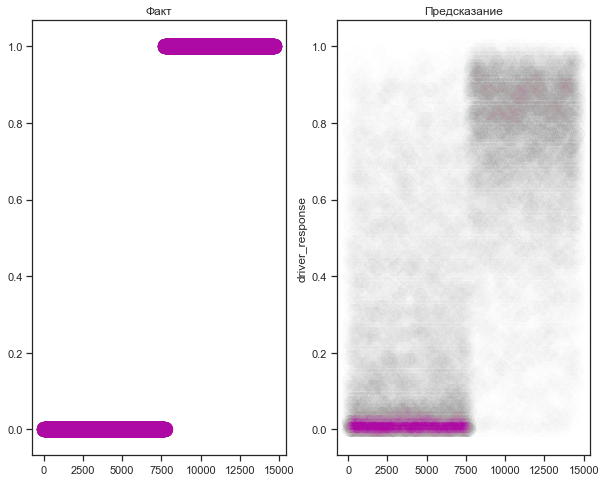

In [611]:
# Визуализация предсказаний модель №3
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 8))
ax = axes.flatten()
plt.ylabel("driver_response")
x_line = list(range(0,len(y_test)))
ax[0].scatter(x_line, y_vals.iloc[:,0].values,s=200, c='#ad09a399')
#ax[0].plot(x_line, y_vals.iloc[:,0].values, "r.")
#ax[1].plot(x_line, y_vals.iloc[:,1].values, "g.")
ax[1].scatter(x_line, y_vals.iloc[:,1].values,s=200,c='#ad09a301')
ax[0].set_title("Факт")
ax[1].set_title("Предсказание")
plt.show()

**Оценка качества модели Деревья решений (RandomForestRegressor) Модель №3:**

In [660]:
model_pred = model.predict(X_test)
#print(classification_report(y_test, model_pred))
model.score(X_test, y_test)

0.4621009030397194

## 8. Модели XGBoost

In [645]:
# Колонки для исключения из тренировочного набора данных:
# 'ride_type_desc_enc', 'order_gk','offer_gk', 'duration_min','weekday_key')
# Надо не забыть колонки обозначенные выше -  columns_for_encode

del_cols = (['ride_type_desc_enc', 
             'order_gk',
             'offer_gk', 
            'duration_min',
            'weekday_key'])

# Колонка для прогнозирования
target_col = ['driver_response']

# Итоговый датафрейм для обучения
df2 = m4_data.drop(columns_for_encode + del_cols, axis = 1)
df2.sample(7)

,hour_key,driver_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,driver_response,offer_class_group_enc
271,7,6080,55.789,37.522,55.798,37.520,63.194,0,4
82687,13,3371,55.704,37.539,55.697,37.554,7.918,1,4
78827,16,6255,55.762,37.571,55.764,37.571,4.519,1,1
82516,22,3022,55.757,37.632,55.759,37.643,1.320,1,4
21558,22,949,55.776,37.656,55.776,37.649,6.169,1,1
32786,22,4735,55.780,37.577,55.770,37.581,8.230,0,1
87140,2,235,55.415,37.899,55.410,37.902,39.372,1,4


In [285]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73437 entries, 1 to 99999
Data columns (total 14 columns):
offer_gk                  73437 non-null int64
weekday_key               73437 non-null int64
hour_key                  73437 non-null int64
driver_gk                 73437 non-null int64
order_gk                  73437 non-null int64
driver_latitude           73437 non-null float64
driver_longitude          73437 non-null float64
origin_order_latitude     73437 non-null float64
origin_order_longitude    73437 non-null float64
distance_km               73437 non-null float64
duration_min              73437 non-null float64
driver_response           73437 non-null int64
offer_class_group_enc     73437 non-null int64
ride_type_desc_enc        73437 non-null int64
dtypes: float64(6), int64(8)
memory usage: 10.9 MB


In [646]:
# Делим очищенные и преобразованные данные (df2) на признаки и целевой показатель
x_columns =[x for x in df2.columns if x != 'driver_response']
X = df2[x_columns]
y = df2.loc[:,['driver_response']].iloc[:,0].values

In [647]:
# Делим данные на обучающую (80% данных) и тестовую (20% данных) выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

- **Создание и обучение модели XGBoost.** (установить библиотеку XGBoost можно стандартным образом при помощи pip install xgboost. Создадим модель классификатора и обучим его на данных обучающей выборки):

In [176]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [177]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [648]:
# выбираем количество деревьев n_estimators=300
model = XGBClassifier(n_estimators=300)

# Обучаем модель
model.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=300, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

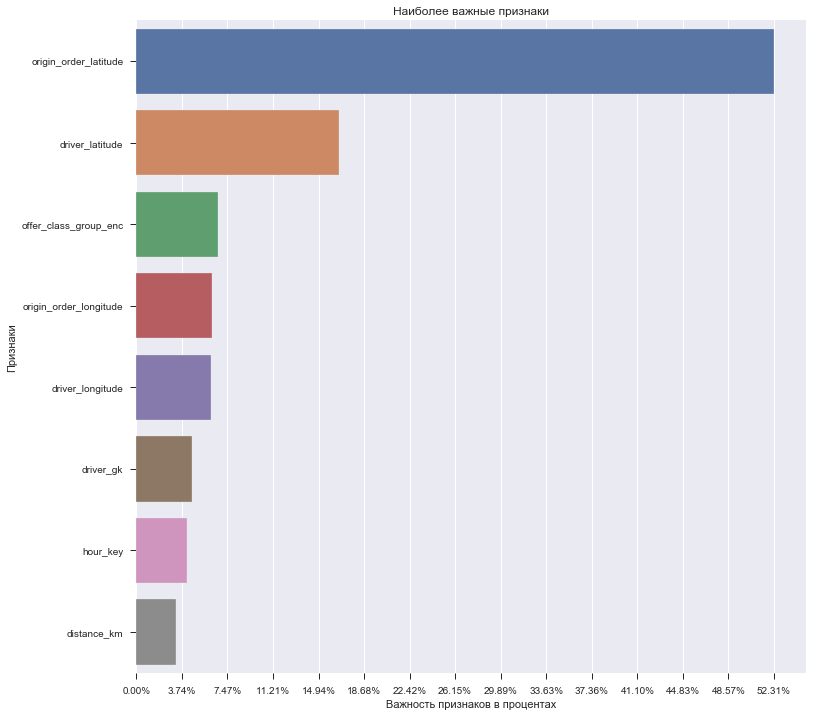

,0
origin_order_latitude,0.523
driver_latitude,0.166
offer_class_group_enc,0.067
origin_order_longitude,0.062
driver_longitude,0.061
driver_gk,0.046
hour_key,0.042
distance_km,0.033


In [649]:
headers = list(X_train.columns.values)
# Важность признаков
feature_imp = pd.Series(model.feature_importances_,index=headers).sort_values(ascending=False)

f, ax = plt.subplots(figsize=(12, 12))
sns.barplot(x=feature_imp, y=feature_imp.index)
x_ticks = np.linspace(start = 0, stop=max(feature_imp), num =  15, endpoint = True)
plt.xticks(x_ticks, [f"{x:0.2%}" for x in x_ticks])
plt.xlabel('Важность признаков в процентах')
plt.ylabel('Признаки')
plt.title("Наиболее важные признаки")

# Важность на графике
plt.show()
# Важность признаков (DataFrame)
pd.DataFrame(feature_imp)

In [650]:
# Реальные значения driver_response и предсказанные (Prediction)
# Значения y из тестовой выборки 
y_vals = pd.DataFrame({"driver_response":y_test})

# Предсказанные значения
y_vals["Prediction"] = model.predict(X_test).tolist()
y_vals.sort_values(by="driver_response", inplace= True)

# Оценка точности предсказания
delt = 1 - (y_vals['driver_response'] - y_vals['Prediction']).abs().sum()/len(y_vals)
print('Оценка точности предсказания: ',delt)

y_vals.sample(7)

Оценка точности предсказания:  0.7933687363834423


,driver_response,Prediction
3919,0,0
4416,0,0
14039,1,1
7655,1,1
13804,0,0
8492,1,1
3240,1,0


- **Оценка результата моделирования** (функцией accuracy_score)

In [651]:
print("Оценка абсолютной точности:           \t" ,accuracy_score(y_vals['driver_response'], y_vals['Prediction']))

Оценка абсолютной точности:           	 0.7933687363834423


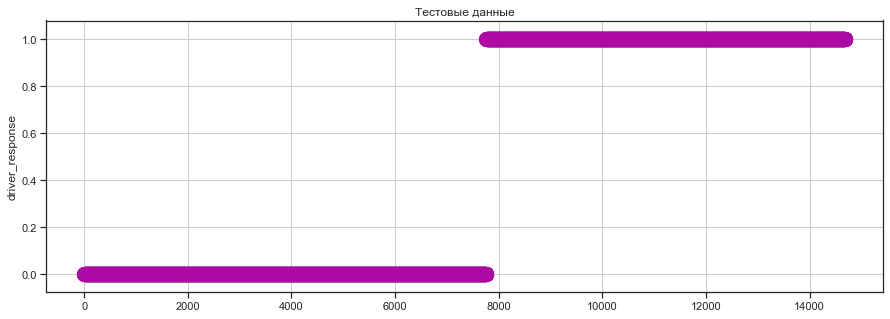

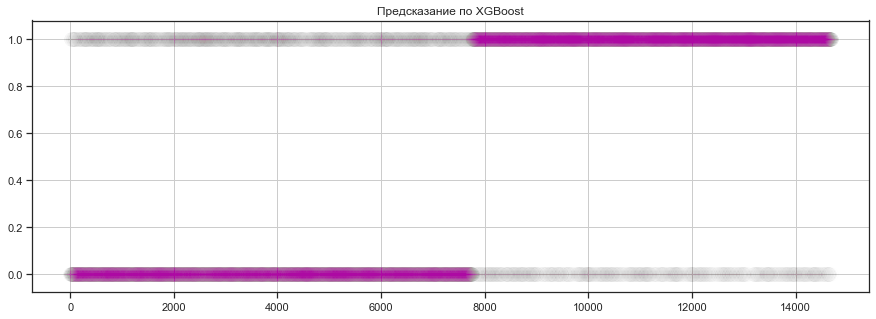

In [604]:
# Визуализация предсказаний (модель XGBoost)
fig, ax = plt.subplots(figsize=(15, 5))
plt.ylabel("driver_response")
x_line = list(range(0,len(y_test)))
ax.scatter(x_line, y_vals.iloc[:,0].values,s=200, c='#ad09a399')
ax.set_title("Тестовые данные")
ax.grid()
plt.show()

fig, ax = plt.subplots(figsize=(15, 5))
x_line = list(range(0,len(y_test)))
ax.set_title("Предсказание по XGBoost")
ax.scatter(x_line, y_vals.iloc[:,1].values,s=200,c='#ad09a301')
ax.grid()
plt.show()

**На втором графике - редкие))) ошибочные предсказания изображены серым облаком, соответственно, вдоль единицы и нуля.**

**Оценка качества модели XGBoost**

In [652]:
model_pred = model.predict(X_test)
print(classification_report(y_test, model_pred))
model.score(X_test, y_test)

              precision    recall  f1-score   support

           0       0.85      0.74      0.79      7730
           1       0.75      0.85      0.80      6958

    accuracy                           0.79     14688
   macro avg       0.80      0.80      0.79     14688
weighted avg       0.80      0.79      0.79     14688



0.7933687363834423

**Модель XGBoost дала точность предсказания порядка 80%**

**С моделью RandomForestRegressor удалось добиться точности предсказания не больше 47%**

**Для дата сета taxi.csv модель XGBoost показывает лучшие результаты по точности предсказания  по сравнению с  моделями RandomForestRegressor**